In [36]:
pwd

'/autofs/nccsopen-svm1_home/ud4/repos/sharma-bharat/FATESFACE/Jupyter_Notebooks'

In [37]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import socket

## Logs of File
Reading the logs of the print file for the data in the file `components/elm/src/external_models/fates/biogeochem/EDPhysiologyMod.F90`

### Printing the following lines of the Phenology routine `phenology` in the file `EDPhysiologyMod.F90` for cold deciduous only

```
    print*,'sinkhole_phenology', model_day_int,temp_in_C,ncdstart,gddstart, currentSite%nchilldays, gdd_threshold,ncolddays, &
      currentSite%grow_deg_days, currentSite%cleafoffdate, currentSite%cndaysleafoff,currentSite%cleafondate,currentSite%cndaysleafon
    print*,'sinkhole_phenology_def',phen_cstat_iscold,phen_cstat_nevercold,phen_cstat_notcold

    !LEAF ON: COLD DECIDUOUS. Needs to
    !1) have exceeded the growing degree day threshold
    !2) The leaves should not be on already
    !3) There should have been at least one chilling day in the counting period.
    !   this prevents tropical or warm climate plants that are "cold-deciduous"
    !   from ever re-flushing after they have reached their maximum age (thus
    !   preventing them from competing
    print*,'sinkhole_phenology_LOn1', model_day_int,currentSite%cstatus,ED_val_phen_mindayson,currentSite%grow_deg_days,gdd_threshold,currentSite%nchilldays,currentSite%cleafondate

    if ( any(currentSite%cstatus == [phen_cstat_iscold,phen_cstat_nevercold]) .and. &
         (currentSite%grow_deg_days > gdd_threshold) .and. &
         (currentSite%cndaysleafoff > ED_val_phen_mindayson) .and. &
         (currentSite%nchilldays >= 1)) then
       currentSite%cstatus = phen_cstat_notcold  ! Set to not-cold status (leaves can come on)
       currentSite%cleafondate = model_day_int
       currentSite%cndaysleafon = 0
       currentSite%grow_deg_days = 0._r8 ! zero GDD for the rest of the year until counting season begins.
       if ( debug ) write(fates_log(),*) 'leaves on'
    endif !GDD
    print*,'sinkhole_phenology_LOn2', model_day_int,currentSite%cstatus, currentSite%cleafondate,currentSite%grow_deg_days
    
    !LEAF OFF: COLD THRESHOLD
    !Needs to:
    !1) have exceeded the number of cold days threshold
    !2) have exceeded the minimum leafon time.
    !3) The leaves should not be off already
    !4) The day of simulation should be larger than the counting period.

    print*,'sinkhole_phenology_LOff1', model_day_int,currentSite%cstatus,num_vegtemp_mem,ED_val_phen_ncolddayslim,ED_val_phen_mindayson,currentSite%cndaysleafon
    if ( (currentSite%cstatus == phen_cstat_notcold) .and. &
         (model_day_int > num_vegtemp_mem)      .and. &
         (ncolddays > ED_val_phen_ncolddayslim) .and. &
         (currentSite%cndaysleafon > ED_val_phen_mindayson) )then

       currentSite%grow_deg_days  = 0._r8          ! The equations for Botta et al
       ! are for calculations of
       ! first flush, but if we dont
       ! clear this value, it will cause
       ! leaves to flush later in the year
       currentSite%cstatus       = phen_cstat_iscold  ! alter status of site to 'leaves off'
       currentSite%cleafoffdate = model_day_int       ! record leaf off date
       currentSite%cndaysleafoff = 0

       if ( debug ) write(fates_log(),*) 'leaves off'
    endif

    print*,'sinkhole_phenology_LOff2', model_day_int,currentSite%cstatus , currentSite%grow_deg_days,currentSite%cndaysleafoff

    ! LEAF OFF: COLD LIFESPAN THRESHOLD
    ! NOTE: Some areas of the planet will never generate a cold day
    ! and thus %nchilldays will never go from zero to 1.  The following logic
    ! when coupled with this fact will essentially prevent cold-deciduous
    ! plants from re-emerging in areas without at least some cold days

    print*,'sinkhole_phenology_LOff_th', model_day_int,currentSite%cstatus, currentSite%cndaysleafoff,currentSite%cleafoffdate
    if( (currentSite%cstatus == phen_cstat_notcold)  .and. &
        (currentSite%cndaysleafoff > 400)) then   ! remove leaves after a whole year,
                                                  ! when there is no 'off' period.
       currentSite%grow_deg_days  = 0._r8

       currentSite%cstatus = phen_cstat_nevercold  ! alter status of site to imply that this
       ! site is never really cold enough
       ! for cold deciduous
       currentSite%cleafoffdate = model_day_int    ! record leaf off date
       currentSite%cndaysleafoff = 0

       if ( debug ) write(fates_log(),*) 'leaves off'
    endif
    print*,'sinkhole_phenology_LOff_th2', model_day_int,currentSite%cstatus,currentSite%grow_deg_days ,currentSite%cndaysleafoff
    
```

## More_logs: `PRTAllometricCNPMod.F90`

`885     print*, 'sinkhole_L2FR',trim(dateTimeString) ,cx_logratio, cp_ratio, cn_ratio, cx_int, &` <br>
`886         dcxdt_ratio, ema_dcxdt, cx0, l2fr_delta, l2fr, store_c_max, store_c_act, &` <br>
`887         store_nut_max, store_nut_act, l2fr_min, store_N_max, store_N_act, &     ` <br>
`888         store_P_max, store_P_act, dbh, leaf_status   `

`965          print*, 'sinkhole_Trim',trim(dateTimeString), elongf_fnrt, fnrt_flux_c, target_fnrt_c`


###  Extract selected Logs lines e.g.
`sed -n '/sinkhole/p' e3sm.log.4184005.230809-134742 > PIDH_AgBgW_r0811_l2fr.txt`

In [38]:
machine_name = socket.gethostname()
if "baseline" in machine_name:
    print("We are on: baseline")

elif "or-slurm" in machine_name:
    print ("We are on: cades")

elif "MAC132004" in machine_name:
    print("We are on: macbook")
else:
    print("other than baseline, cades, or LAB macbook")


We are on: baseline


In [39]:
# Paths
if "baseline" in machine_name:
    path_in_logs = "/ccsopen/home/ud4/repos/sharma-bharat/FATESFACE/Print_Logs/"


if "MAC132004" in machine_name:
    path_in_logs = "/Users/ud4/repos/GitHub/FATESFACE/Print_Logs"

In [69]:
file_name = "Phenology_log_r240313.txt"
file_name = "Phenology_log_r240313_phen500.txt"
file_name = "Logs_FR_r240512_ORNL_RD_pheno.txt"
file_name_trim = "Logs_FR_r240512_ORNL_RD_Trim.txt"

In [70]:
with open(f'{path_in_logs}/{file_name}', 'r') as infile:
    data = infile.read()

with open(f'{path_in_logs}/{file_name_trim}', 'r') as infile:
    data_trim = infile.read()

In [42]:
# How long do you want the simulation plots?
max_r_years = 40
max_line_idx = max_r_years*365*8 # 30 years * 364 days * 8 freq output per day

In [43]:
# Split data into lines
lines = data.split('\n')

# Initialize a dictionary of dataframes
dfs = {}

# Iterate over lines and create dataframes based on the first item i.e. print header
for line_idx, line in enumerate(lines):
    parts = line.split()
    key = parts[0]
    if key not in dfs:
        dfs[key] = []
    dfs[key].append(parts)
    if line_idx>max_line_idx:
        break




In [44]:
max_line_idx

116800

In [45]:
column_names = {}
column_names ['sinkhole_phenology'] = ['Name', 'Model_Day', 'temp_in_C', 'ncdstart','gddstart', 'nchilldays', 'gdd_threshold','ncolddays', 'grow_deg_days', 'cleafoffdate', 'cndaysleafoff','cleafondate','cndaysleafon']
column_names ['sinkhole_phenology_def'] = ['Name', 'phen_cstat_iscold', 'phen_cstat_nevercold', 'phen_cstat_notcold']
column_names ['sinkhole_phenology_LOn1'] = ['Name', 'Model_Day', 'cstatus', 'ED_val_phen_mindayson','grow_deg_days','gdd_threshold','nchilldays','cleafondate']
column_names ['sinkhole_phenology_LOn2'] = ['Name', 'Model_Day', 'cstatus', 'cleafondate','grow_deg_days']
column_names ['sinkhole_phenology_LOff1'] = ['Name', 'Model_Day', 'cstatus', 'num_vegtemp_mem','ED_val_phen_ncolddayslim','ED_val_phen_mindayson','cndaysleafon']
column_names ['sinkhole_phenology_LOff2'] = ['Name', 'Model_Day', 'cstatus', 'grow_deg_days','cndaysleafoff']
column_names ['sinkhole_phenology_LOff_th'] = ['Name', 'Model_Day', 'cstatus', 'cndaysleafoff','cleafoffdate']
column_names ['sinkhole_phenology_LOff_th2'] = ['Name', 'Model_Day', 'cstatus', 'grow_deg_days','cndaysleafoff']


In [46]:
dict_of_dataframes = {}
# Create dataframes from lists of lists
for key, values in dfs.items():
    df = pd.DataFrame(values,columns=column_names[key])
    print(f"Dataframe for {key}:")
    print(df)
    print()
    dict_of_dataframes[key] = df

Dataframe for sinkhole_phenology:
                     Name Model_Day                 temp_in_C ncdstart  \
0      sinkhole_phenology         1        15.000000000000057      270   
1      sinkhole_phenology         2  -3.5682477014404412E-002      270   
2      sinkhole_phenology         3        2.5705667566800230      270   
3      sinkhole_phenology         4        13.474796073364871      270   
4      sinkhole_phenology         5        17.678093623749760      270   
...                   ...       ...                       ...      ...   
14596  sinkhole_phenology     14597      -0.88491243717447787      270   
14597  sinkhole_phenology     14598       -1.0549192347753547      270   
14598  sinkhole_phenology     14599        1.3331219375898513      270   
14599  sinkhole_phenology     14600   4.2535324626157944E-002      270   
14600  sinkhole_phenology     14601        2.9416862304902338      270   

      gddstart nchilldays       gdd_threshold ncolddays       grow_deg_days  

In [47]:
# Making the columns as floats except of the 1st
for key in dict_of_dataframes.keys():
    for k in dict_of_dataframes[key].columns[1:]:
        dict_of_dataframes[key][k] = dict_of_dataframes[key][k].astype(float)

In [48]:
dict_of_dataframes['sinkhole_phenology'].head()


,Name,Model_Day,temp_in_C,ncdstart,gddstart,nchilldays,gdd_threshold,ncolddays,grow_deg_days,cleafoffdate,cndaysleafoff,cleafondate,cndaysleafon
0,sinkhole_phenology,1.0,15.000000,270.0,1.0,0.0,570.000000,9.0,0.0,299.0,67.0,99.0,267.0
1,sinkhole_phenology,2.0,-0.035682,270.0,1.0,1.0,563.651794,9.0,0.0,299.0,68.0,99.0,268.0
2,sinkhole_phenology,3.0,2.570567,270.0,1.0,2.0,557.366754,9.0,0.0,299.0,69.0,99.0,269.0
3,sinkhole_phenology,4.0,13.474796,270.0,1.0,2.0,557.366754,8.0,0.0,299.0,70.0,99.0,270.0
4,sinkhole_phenology,5.0,17.678094,270.0,1.0,2.0,557.366754,7.0,0.0,299.0,71.0,99.0,271.0


In [49]:
dict_of_dataframes['sinkhole_phenology_def'].head()


,Name,phen_cstat_iscold,phen_cstat_nevercold,phen_cstat_notcold
0,sinkhole_phenology_def,1.0,0.0,2.0
1,sinkhole_phenology_def,1.0,0.0,2.0
2,sinkhole_phenology_def,1.0,0.0,2.0
3,sinkhole_phenology_def,1.0,0.0,2.0
4,sinkhole_phenology_def,1.0,0.0,2.0


In [50]:
dict_of_dataframes['sinkhole_phenology_LOn1'].head()


,Name,Model_Day,cstatus,ED_val_phen_mindayson,grow_deg_days,gdd_threshold,nchilldays,cleafondate
0,sinkhole_phenology_LOn1,1.0,2.0,90.0,0.0,570.000000,0.0,99.0
1,sinkhole_phenology_LOn1,2.0,2.0,90.0,0.0,563.651794,1.0,99.0
2,sinkhole_phenology_LOn1,3.0,2.0,90.0,0.0,557.366754,2.0,99.0
3,sinkhole_phenology_LOn1,4.0,2.0,90.0,0.0,557.366754,2.0,99.0
4,sinkhole_phenology_LOn1,5.0,2.0,90.0,0.0,557.366754,2.0,99.0


In [51]:
dict_of_dataframes['sinkhole_phenology_LOn2'].head()


,Name,Model_Day,cstatus,cleafondate,grow_deg_days
0,sinkhole_phenology_LOn2,1.0,2.0,99.0,0.0
1,sinkhole_phenology_LOn2,2.0,2.0,99.0,0.0
2,sinkhole_phenology_LOn2,3.0,2.0,99.0,0.0
3,sinkhole_phenology_LOn2,4.0,2.0,99.0,0.0
4,sinkhole_phenology_LOn2,5.0,2.0,99.0,0.0


In [52]:
dict_of_dataframes['sinkhole_phenology_LOff1'].head()


,Name,Model_Day,cstatus,num_vegtemp_mem,ED_val_phen_ncolddayslim,ED_val_phen_mindayson,cndaysleafon
0,sinkhole_phenology_LOff1,1.0,2.0,10.0,5.0,90.0,267.0
1,sinkhole_phenology_LOff1,2.0,2.0,10.0,5.0,90.0,268.0
2,sinkhole_phenology_LOff1,3.0,2.0,10.0,5.0,90.0,269.0
3,sinkhole_phenology_LOff1,4.0,2.0,10.0,5.0,90.0,270.0
4,sinkhole_phenology_LOff1,5.0,2.0,10.0,5.0,90.0,271.0


In [53]:
dict_of_dataframes['sinkhole_phenology_LOff2'].head()


,Name,Model_Day,cstatus,grow_deg_days,cndaysleafoff
0,sinkhole_phenology_LOff2,1.0,2.0,0.0,67.0
1,sinkhole_phenology_LOff2,2.0,2.0,0.0,68.0
2,sinkhole_phenology_LOff2,3.0,2.0,0.0,69.0
3,sinkhole_phenology_LOff2,4.0,2.0,0.0,70.0
4,sinkhole_phenology_LOff2,5.0,2.0,0.0,71.0


In [54]:
dict_of_dataframes['sinkhole_phenology_LOff_th'].head()


,Name,Model_Day,cstatus,cndaysleafoff,cleafoffdate
0,sinkhole_phenology_LOff_th,1.0,2.0,67.0,299.0
1,sinkhole_phenology_LOff_th,2.0,2.0,68.0,299.0
2,sinkhole_phenology_LOff_th,3.0,2.0,69.0,299.0
3,sinkhole_phenology_LOff_th,4.0,2.0,70.0,299.0
4,sinkhole_phenology_LOff_th,5.0,2.0,71.0,299.0


In [55]:
dict_of_dataframes['sinkhole_phenology_LOff_th2'].head()


,Name,Model_Day,cstatus,grow_deg_days,cndaysleafoff
0,sinkhole_phenology_LOff_th2,1.0,2.0,0.0,67.0
1,sinkhole_phenology_LOff_th2,2.0,2.0,0.0,68.0
2,sinkhole_phenology_LOff_th2,3.0,2.0,0.0,69.0
3,sinkhole_phenology_LOff_th2,4.0,2.0,0.0,70.0
4,sinkhole_phenology_LOff_th2,5.0,2.0,0.0,71.0


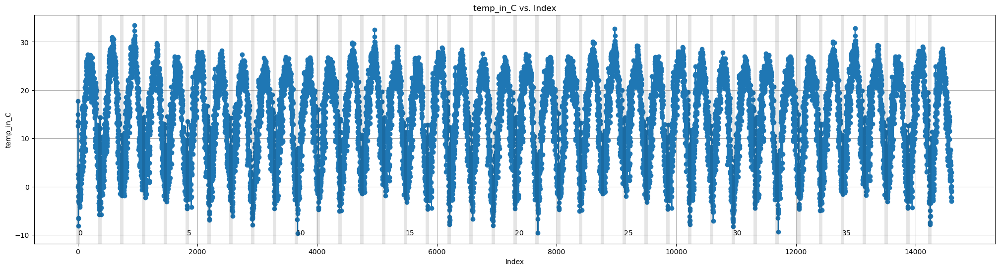

In [56]:
# Plotting
df_key = "sinkhole_phenology"
df_key_col = "temp_in_C"
plt.figure(figsize=(25,6))
plt.plot(dict_of_dataframes[f"{df_key}"].index, dict_of_dataframes[f"{df_key}"][f"{df_key_col}"], marker='o', linestyle='-')
plt.xlabel('Index')
plt.ylabel(f'{df_key_col}')
plt.title(f'{df_key_col} vs. Index')
plt.grid(True)
for i in range(max_r_years):
    plt.axvline(x = i*365, color = 'k',lw=5, alpha=.1)
    if i%5==0:
        plt.text(i*365,-10, int(i))
plt.show()



/tmp/ipykernel_788205/2572094003.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(35,6))


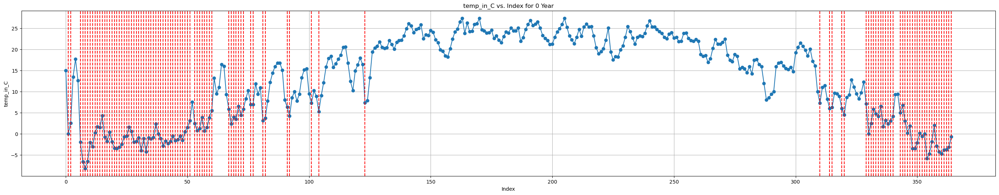

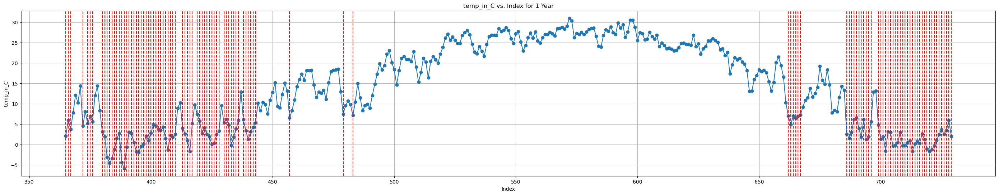

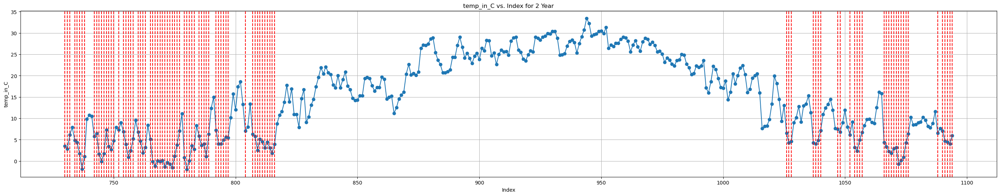

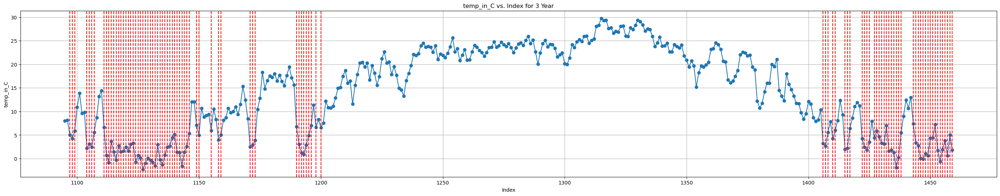

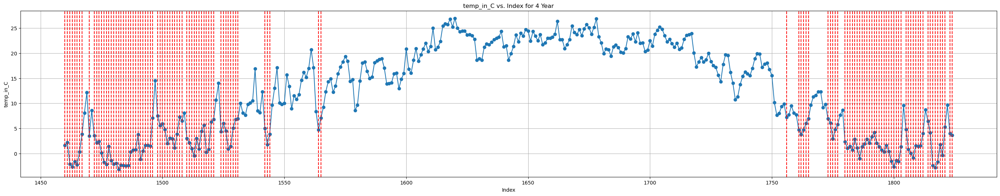

...

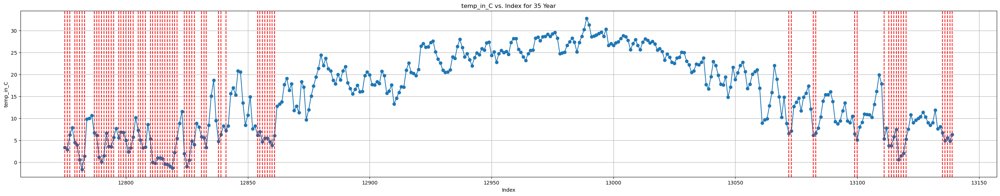

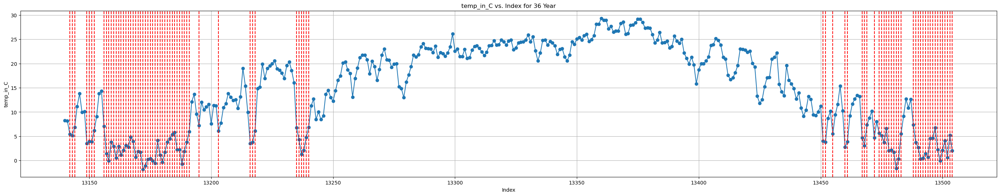

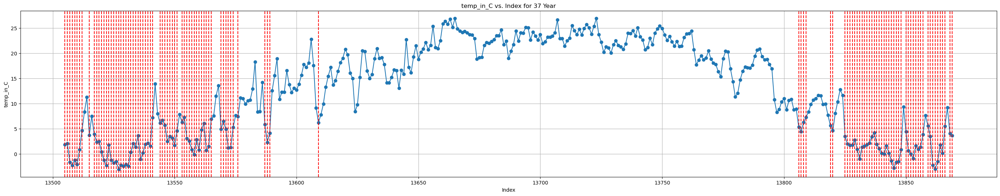

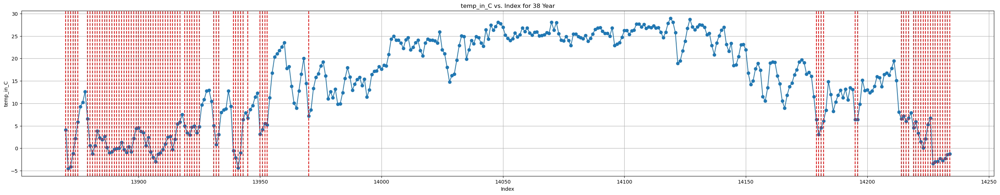

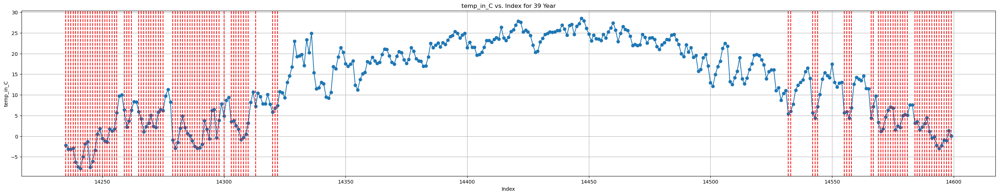

In [57]:
# Plotting
df_key = "sinkhole_phenology"
df_key_col = "temp_in_C"

for i in range(max_r_years):
    plt.figure(figsize=(35,6))

    if i>=1:
        plt.plot(dict_of_dataframes[f"{df_key}"].index[i*365:(i+1)*365], dict_of_dataframes[f"{df_key}"][f"{df_key_col}"][i*365:(i+1)*365], marker='o', linestyle='-')
    else:
        plt.plot(dict_of_dataframes[f"{df_key}"].index[i*365:(i+1)*365], dict_of_dataframes[f"{df_key}"][f"{df_key_col}"][i*365:(i+1)*365], marker='o', linestyle='-')

    zero_indices = dict_of_dataframes[df_key][(dict_of_dataframes[df_key][df_key_col] <= 7.5) & (dict_of_dataframes[df_key].index >= i * 365) & (dict_of_dataframes[df_key].index < (i + 1) * 365)].index
    for idx in zero_indices:
        plt.axvline(x=idx, color='red', linestyle='--')



    plt.xlabel('Index')
    plt.ylabel(f'{df_key_col}')
    plt.title(f'{df_key_col} vs. Index for {i} Year')
    plt.grid(True)
#for i in range(max_r_years):
#    plt.axvline(x = i*365, color = 'k',lw=5, alpha=.1)
#    if i%5==0:
#        plt.text(i*365,-10, int(i))
#plt.show()



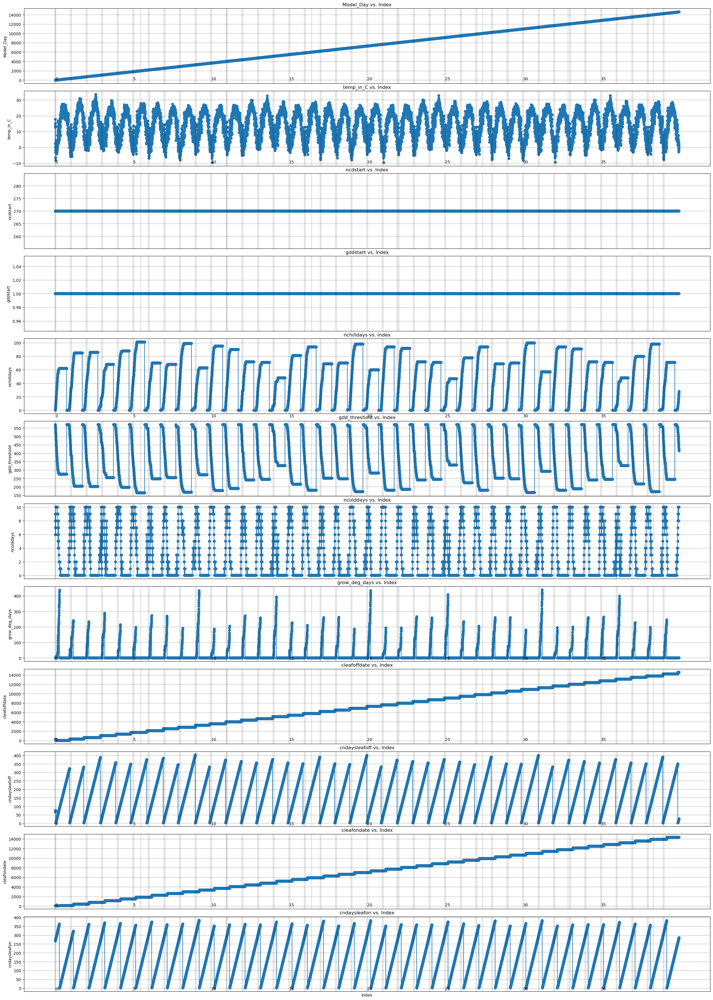

In [58]:
import matplotlib.pyplot as plt

# Assuming ict_of_dataframes is a dictionary of dataframes
# Define the number of rows and columns for subplots
df_key = "sinkhole_phenology"
num_rows = len(dict_of_dataframes[f'{df_key}'].columns[1:]) # Number of rows for subplots
num_cols = 1  # Number of columns for subplots

# Create a figure and axes for subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, 35))

# Iterate over dataframes and plot each one on a separate subplot
for idx, df_key_col in enumerate(dict_of_dataframes[f'{df_key}'].columns[1:]):
    axes[idx].plot(dict_of_dataframes[f"{df_key}"].index, dict_of_dataframes[f"{df_key}"][f"{df_key_col}"], marker='o', linestyle='-', label=key)
    axes[idx].set_ylabel(f'{df_key_col}')
    axes[idx].set_title(f'{df_key_col} vs. Index')
    axes[idx].grid(True)
    #axes[row_idx].legend()
    axes[idx].tick_params(axis='x', which='both', bottom=False, labelbottom=False)

    for i in range(max_r_years):
        axes[idx].axvline(x = i*365, color = 'k',lw=5, alpha=.1)
        if (i%5==0) and (idx not in [2,3]):
            axes[idx].text(i*365,-10, int(i))

axes[idx].set_xlabel('Index')
# Adjust layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()


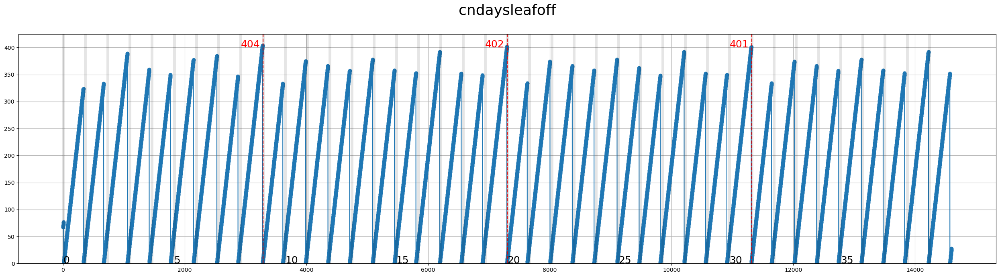

In [59]:
# Ploting leafoff counter only

# Assuming ict_of_dataframes is a dictionary of dataframes
# Define the number of rows and columns for subplots

df_key = "sinkhole_phenology"
df_key_col = "cndaysleafoff"
plt.figure(figsize=(25, 7))

plt.plot(dict_of_dataframes[f"{df_key}"].index, dict_of_dataframes[f"{df_key}"][f"{df_key_col}"], marker='o', linestyle='-', label=key)
for i in range(max_r_years):
    plt.axvline(x = i*365, color = 'k',lw=5, alpha=.1)
    if max(dict_of_dataframes[f"{df_key}"][f"{df_key_col}"][i*365:(i+1)*365]) > 399.5:
        plt.axvline(x=(i+1)*365, color='red', linestyle='--')
        plt.text(i*365,400, int(max(dict_of_dataframes[f"{df_key}"][f"{df_key_col}"][i*365:(i+1)*365])),fontsize=18, color='r')
    if (i%5==0):
        plt.text((i)*365,0, int(i),fontsize=18)
plt.ylim(0,425)
plt.title(f"{df_key_col}\n", fontsize=26)
plt.grid(True)
plt.tight_layout()



#num_rows = len(dict_of_dataframes[f'{df_key}'].columns[1:]) # Number of rows for subplots
#num_cols = 1  # Number of columns for subplots

# Create a figure and axes for subplots
#fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, 35))
'''
# Iterate over dataframes and plot each one on a separate subplot
for idx, df_key_col in enumerate(dict_of_dataframes[f'{df_key}'].columns[1:]):
    axes[idx].plot(dict_of_dataframes[f"{df_key}"].index, dict_of_dataframes[f"{df_key}"][f"{df_key_col}"], marker='o', linestyle='-', label=key)
    axes[idx].set_ylabel(f'{df_key_col}')
    axes[idx].set_title(f'{df_key_col} vs. Index')
    axes[idx].grid(True)
    #axes[row_idx].legend()
    axes[idx].tick_params(axis='x', which='both', bottom=False, labelbottom=False)

    for i in range(max_r_years):
        axes[idx].axvline(x = i*365, color = 'k',lw=5, alpha=.1)
        if (i%5==0) and (idx not in [2,3]):
            axes[idx].text(i*365,-10, int(i))

axes[idx].set_xlabel('Index')
# Adjust layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
zero_indices = dict_of_dataframes[df_key][(dict_of_dataframes[df_key][df_key_col] <= 7.5) & (dict_of_dataframes[df_key].index >= i * 365) & (dict_of_dataframes[df_key].index < (i + 1) * 365)].index
    for idx in zero_indices:
        plt.axvline(x=idx, color='red', linestyle='--')

'''
plt.show()


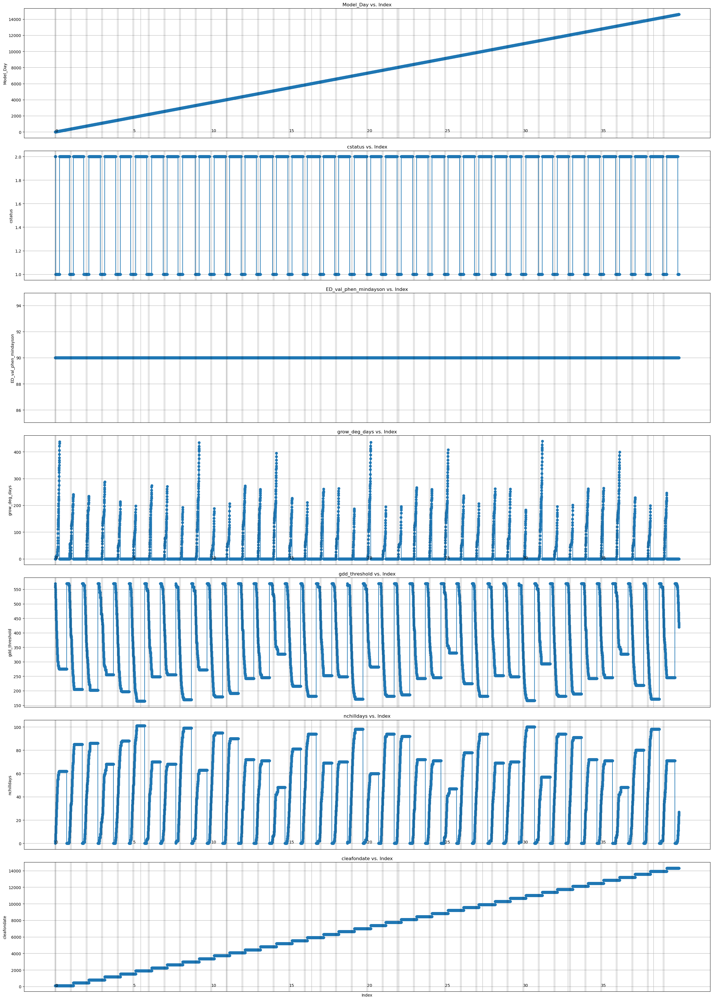

In [60]:
import matplotlib.pyplot as plt

# Assuming ict_of_dataframes is a dictionary of dataframes
# Define the number of rows and columns for subplots
df_key = "sinkhole_phenology_LOn1"
num_rows = len(dict_of_dataframes[f'{df_key}'].columns[1:]) # Number of rows for subplots
num_cols = 1  # Number of columns for subplots

# Create a figure and axes for subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, 35))

# Iterate over dataframes and plot each one on a separate subplot
for idx, df_key_col in enumerate(dict_of_dataframes[f'{df_key}'].columns[1:]):
    axes[idx].plot(dict_of_dataframes[f"{df_key}"].index, dict_of_dataframes[f"{df_key}"][f"{df_key_col}"], marker='o', linestyle='-', label=key)
    axes[idx].set_ylabel(f'{df_key_col}')
    axes[idx].set_title(f'{df_key_col} vs. Index')
    axes[idx].grid(True)
    #axes[row_idx].legend()
    axes[idx].tick_params(axis='x', which='both', bottom=False, labelbottom=False)

    for i in range(max_r_years):
        axes[idx].axvline(x = i*365, color = 'k',lw=5, alpha=.1)
        if (i%5==0) and (idx not in [2]):
            axes[idx].text(i*365,0, int(i))

axes[idx].set_xlabel('Index')
# Adjust layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()


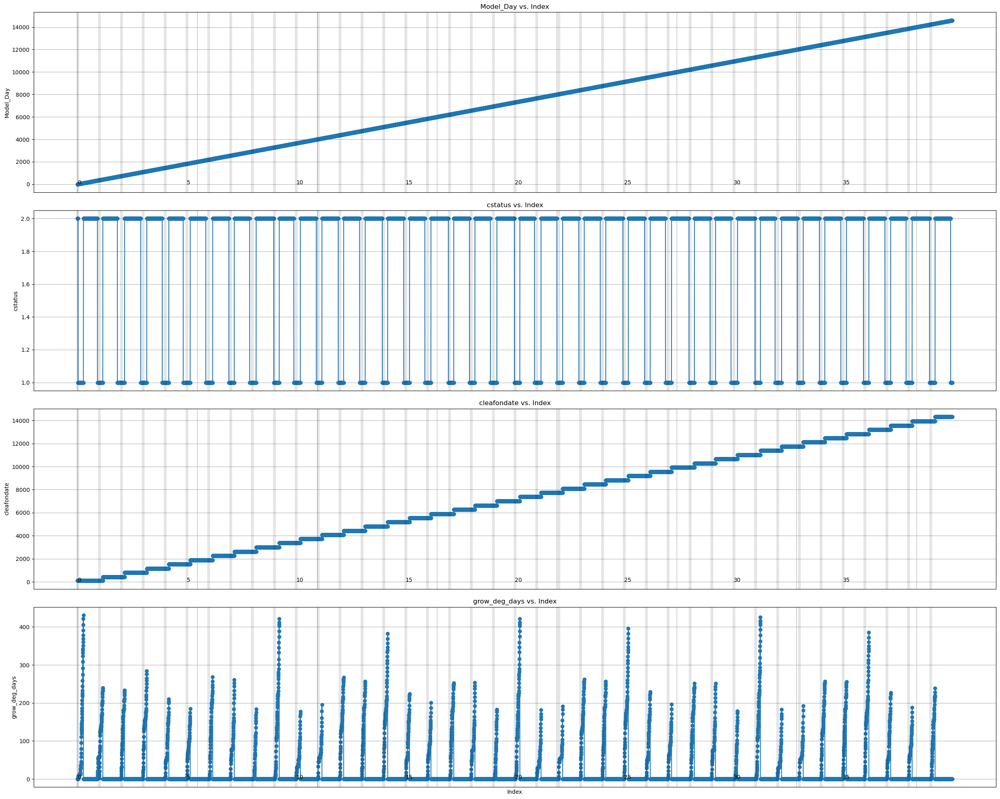

In [61]:
import matplotlib.pyplot as plt

# Assuming ict_of_dataframes is a dictionary of dataframes
# Define the number of rows and columns for subplots
df_key = "sinkhole_phenology_LOn2"
num_rows = len(dict_of_dataframes[f'{df_key}'].columns[1:]) # Number of rows for subplots
num_cols = 1  # Number of columns for subplots

# Create a figure and axes for subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, 20))

# Iterate over dataframes and plot each one on a separate subplot
for idx, df_key_col in enumerate(dict_of_dataframes[f'{df_key}'].columns[1:]):
    axes[idx].plot(dict_of_dataframes[f"{df_key}"].index, dict_of_dataframes[f"{df_key}"][f"{df_key_col}"], marker='o', linestyle='-', label=key)
    axes[idx].set_ylabel(f'{df_key_col}')
    axes[idx].set_title(f'{df_key_col} vs. Index')
    axes[idx].grid(True)
    #axes[row_idx].legend()
    axes[idx].tick_params(axis='x', which='both', bottom=False, labelbottom=False)

    for i in range(max_r_years):
        axes[idx].axvline(x = i*365, color = 'k',lw=5, alpha=.1)
        if (i%5==0) and (idx not in []):
            axes[idx].text(i*365,0, int(i))

axes[idx].set_xlabel('Index')
# Adjust layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()


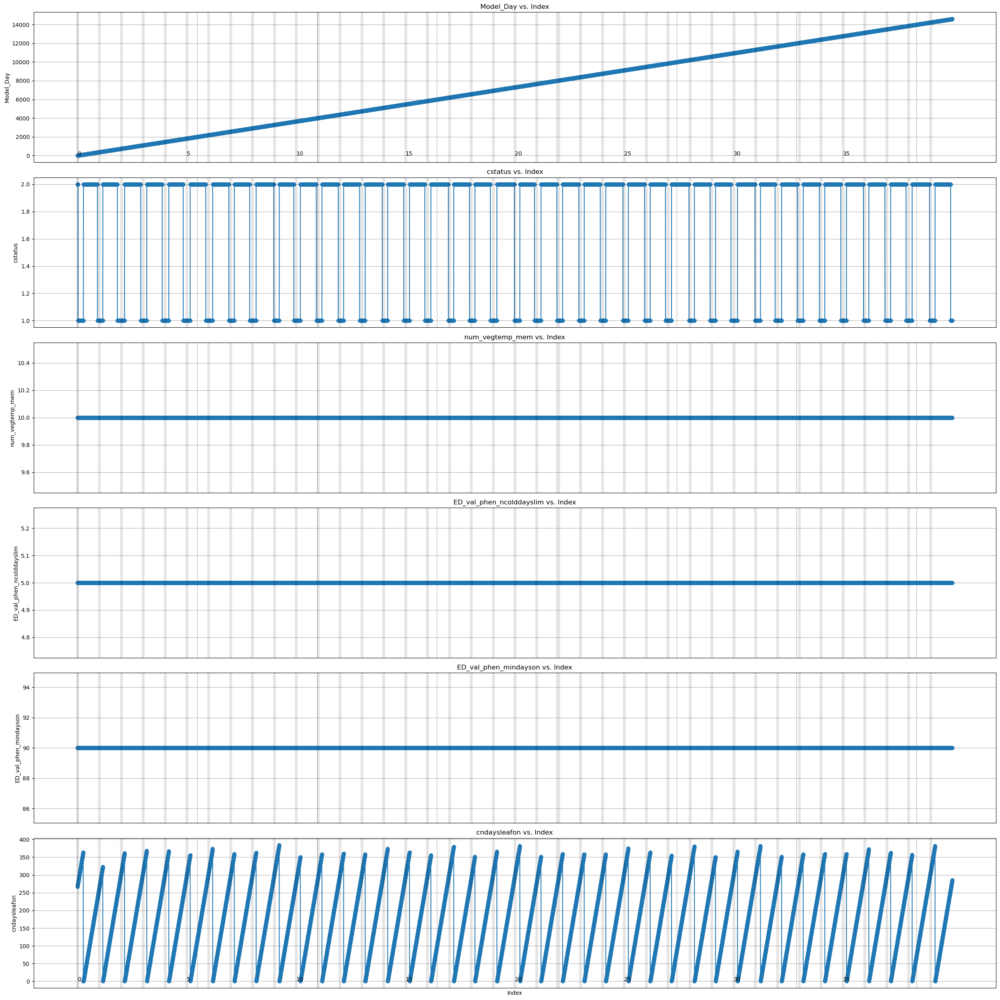

In [62]:
import matplotlib.pyplot as plt

# Assuming ict_of_dataframes is a dictionary of dataframes
# Define the number of rows and columns for subplots
df_key = "sinkhole_phenology_LOff1"
num_rows = len(dict_of_dataframes[f'{df_key}'].columns[1:]) # Number of rows for subplots
num_cols = 1  # Number of columns for subplots

# Create a figure and axes for subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, 25))

# Iterate over dataframes and plot each one on a separate subplot
for idx, df_key_col in enumerate(dict_of_dataframes[f'{df_key}'].columns[1:]):
    axes[idx].plot(dict_of_dataframes[f"{df_key}"].index, dict_of_dataframes[f"{df_key}"][f"{df_key_col}"], marker='o', linestyle='-', label=key)
    axes[idx].set_ylabel(f'{df_key_col}')
    axes[idx].set_title(f'{df_key_col} vs. Index')
    axes[idx].grid(True)
    #axes[row_idx].legend()
    axes[idx].tick_params(axis='x', which='both', bottom=False, labelbottom=False)

    for i in range(max_r_years):
        axes[idx].axvline(x = i*365, color = 'k',lw=5, alpha=.1)
        if (i%5==0) and (idx not in [2,3,4]):
            axes[idx].text(i*365,0, int(i))

axes[idx].set_xlabel('Index')
# Adjust layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()


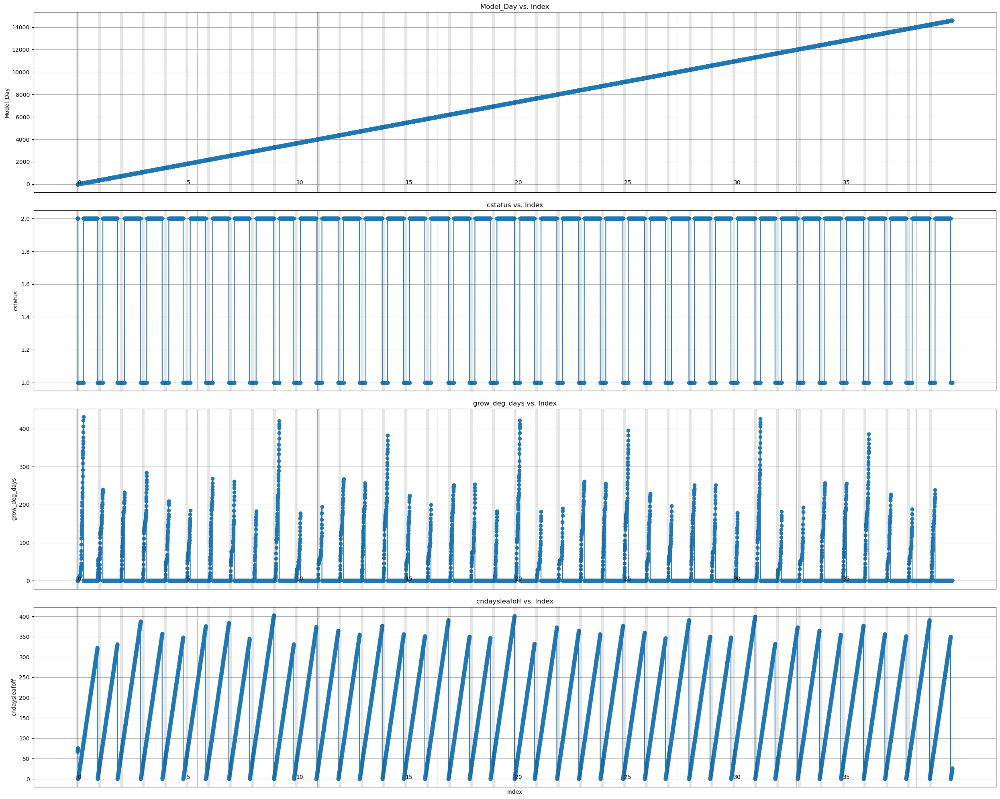

In [63]:
import matplotlib.pyplot as plt

# Assuming ict_of_dataframes is a dictionary of dataframes
# Define the number of rows and columns for subplots
df_key = "sinkhole_phenology_LOff2"
num_rows = len(dict_of_dataframes[f'{df_key}'].columns[1:]) # Number of rows for subplots
num_cols = 1  # Number of columns for subplots

# Create a figure and axes for subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, 20))

# Iterate over dataframes and plot each one on a separate subplot
for idx, df_key_col in enumerate(dict_of_dataframes[f'{df_key}'].columns[1:]):
    axes[idx].plot(dict_of_dataframes[f"{df_key}"].index, dict_of_dataframes[f"{df_key}"][f"{df_key_col}"], marker='o', linestyle='-', label=key)
    axes[idx].set_ylabel(f'{df_key_col}')
    axes[idx].set_title(f'{df_key_col} vs. Index')
    axes[idx].grid(True)
    #axes[row_idx].legend()
    axes[idx].tick_params(axis='x', which='both', bottom=False, labelbottom=False)

    for i in range(max_r_years):
        axes[idx].axvline(x = i*365, color = 'k',lw=5, alpha=.1)
        if (i%5==0) and (idx not in []):
            axes[idx].text(i*365,0, int(i))

axes[idx].set_xlabel('Index')
# Adjust layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()


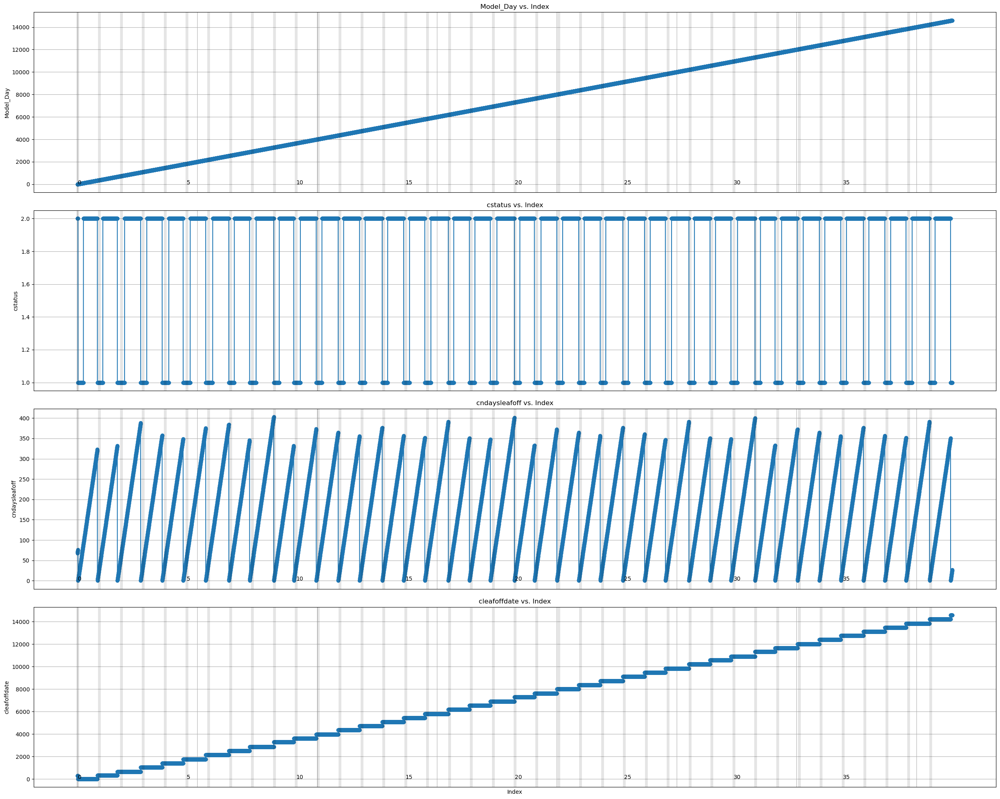

In [64]:
 import matplotlib.pyplot as plt

# Assuming ict_of_dataframes is a dictionary of dataframes
# Define the number of rows and columns for subplots
df_key = "sinkhole_phenology_LOff_th"
num_rows = len(dict_of_dataframes[f'{df_key}'].columns[1:]) # Number of rows for subplots
num_cols = 1  # Number of columns for subplots

# Create a figure and axes for subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, 20))

# Iterate over dataframes and plot each one on a separate subplot
for idx, df_key_col in enumerate(dict_of_dataframes[f'{df_key}'].columns[1:]):
    axes[idx].plot(dict_of_dataframes[f"{df_key}"].index, dict_of_dataframes[f"{df_key}"][f"{df_key_col}"], marker='o', linestyle='-', label=key)
    axes[idx].set_ylabel(f'{df_key_col}')
    axes[idx].set_title(f'{df_key_col} vs. Index')
    axes[idx].grid(True)
    #axes[row_idx].legend()
    axes[idx].tick_params(axis='x', which='both', bottom=False, labelbottom=False)

    for i in range(max_r_years):
        axes[idx].axvline(x = i*365, color = 'k',lw=5, alpha=.1)
        if (i%5==0) and (idx not in []):
            axes[idx].text(i*365,0, int(i))

axes[idx].set_xlabel('Index')
# Adjust layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()


In [65]:
# when did the status change?

dict_of_dataframes[f"{df_key}"]["cstatus"][dict_of_dataframes[f"{df_key}"]["cstatus"]==0].head()

Series([], Name: cstatus, dtype: float64)

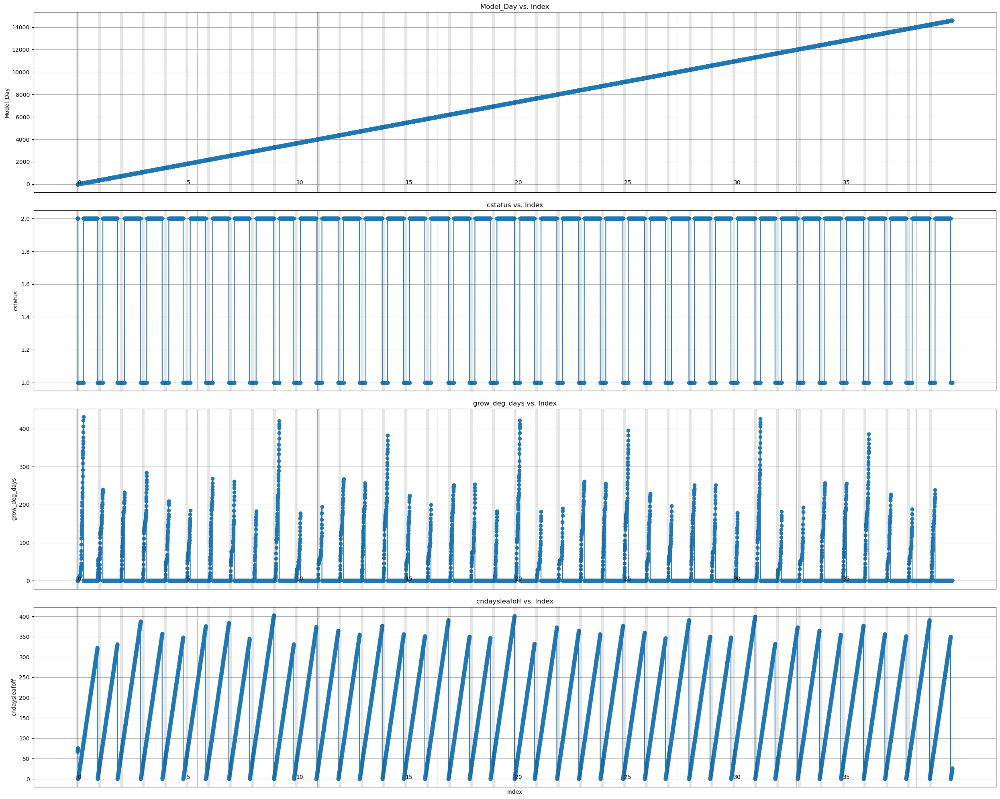

In [66]:
import matplotlib.pyplot as plt

# Assuming ict_of_dataframes is a dictionary of dataframes
# Define the number of rows and columns for subplots
df_key = "sinkhole_phenology_LOff_th2"
num_rows = len(dict_of_dataframes[f'{df_key}'].columns[1:]) # Number of rows for subplots
num_cols = 1  # Number of columns for subplots

# Create a figure and axes for subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, 20))

# Iterate over dataframes and plot each one on a separate subplot
for idx, df_key_col in enumerate(dict_of_dataframes[f'{df_key}'].columns[1:]):
    axes[idx].plot(dict_of_dataframes[f"{df_key}"].index, dict_of_dataframes[f"{df_key}"][f"{df_key_col}"], marker='o', linestyle='-', label=key)
    axes[idx].set_ylabel(f'{df_key_col}')
    axes[idx].set_title(f'{df_key_col} vs. Index')
    axes[idx].grid(True)
    #axes[row_idx].legend()
    axes[idx].tick_params(axis='x', which='both', bottom=False, labelbottom=False)

    for i in range(max_r_years):
        axes[idx].axvline(x = i*365, color = 'k',lw=5, alpha=.1)
        if (i%5==0) and (idx not in []):
            axes[idx].text(i*365,0, int(i))

axes[idx].set_xlabel('Index')
# Adjust layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()


## Mystery

What happend a day before that led to state change?


In [67]:
index = 7290
print(f"index:{index}")
print(f"cstatus: {dict_of_dataframes[f'sinkhole_phenology_LOff_th']['cstatus'][index]}")
print ("That means the state is 'phen_cstat_notcold' state and leaves are allowed to flush")
print(f"grow_deg_days: {dict_of_dataframes[f'sinkhole_phenology_LOn1']['grow_deg_days'][index]}")
print(f"gdd_threshold: {round(dict_of_dataframes[f'sinkhole_phenology_LOn1']['gdd_threshold'][index],3)}")
print(f"cleafondate: {dict_of_dataframes[f'sinkhole_phenology_LOn1']['cleafondate'][index]}")
print(f"nchilldays: {dict_of_dataframes[f'sinkhole_phenology_LOn1']['nchilldays'][index]}")
print(f"cndaysleafon: {dict_of_dataframes[f'sinkhole_phenology_LOff1']['cndaysleafon'][index]}")
print(f"temp_in_C: {round(dict_of_dataframes[f'sinkhole_phenology']['temp_in_C'][index],3)}")
print(f"ncdstart: {round(dict_of_dataframes[f'sinkhole_phenology']['ncdstart'][index],3)}")
print (f"Nov 1 after 19 years {365*19+270}")
print(f"gddstart: {round(dict_of_dataframes[f'sinkhole_phenology']['gddstart'][index],3)}")
print (f"Jan 1 after 19 years {365*19+1}")
print (f"Jan 1 after 20 years {365*20+1}")
print(f"ncolddays: {round(dict_of_dataframes[f'sinkhole_phenology']['ncolddays'][index],3)}")
print(f"cleafoffdate: {round(dict_of_dataframes[f'sinkhole_phenology']['cleafoffdate'][index],3)}")
print(f"cndaysleafoff: {round(dict_of_dataframes[f'sinkhole_phenology']['cndaysleafoff'][index],3)}")
print(f"cleafondate: {round(dict_of_dataframes[f'sinkhole_phenology']['cleafondate'][index],3)}")
print(f"cndaysleafon: {round(dict_of_dataframes[f'sinkhole_phenology']['cndaysleafon'][index],3)}")





index:7290
cstatus: 2.0
That means the state is 'phen_cstat_notcold' state and leaves are allowed to flush
grow_deg_days: 0.0
gdd_threshold: 538.884
cleafondate: 7002.0
nchilldays: 5.0
cndaysleafon: 289.0
temp_in_C: 2.259
ncdstart: 270.0
Nov 1 after 19 years 7205
gddstart: 1.0
Jan 1 after 19 years 6936
Jan 1 after 20 years 7301
ncolddays: 3.0
cleafoffdate: 6892.0
cndaysleafoff: 399.0
cleafondate: 7002.0
cndaysleafon: 289.0


In [68]:
index = 7294
print(f"index:{index}")
print(f"cstatus: {dict_of_dataframes[f'sinkhole_phenology_LOff_th']['cstatus'][index]}")
print ("That means the state is 'phen_cstat_notcold' state and leaves are allowed to flush")
print(f"grow_deg_days: {dict_of_dataframes[f'sinkhole_phenology_LOn1']['grow_deg_days'][index]}")
print(f"gdd_threshold: {round(dict_of_dataframes[f'sinkhole_phenology_LOn1']['gdd_threshold'][index],3)}")
print(f"cleafondate: {dict_of_dataframes[f'sinkhole_phenology_LOn1']['cleafondate'][index]}")
print(f"nchilldays: {dict_of_dataframes[f'sinkhole_phenology_LOn1']['nchilldays'][index]}")
print(f"cndaysleafon: {dict_of_dataframes[f'sinkhole_phenology_LOff1']['cndaysleafon'][index]}")
print(f"temp_in_C: {round(dict_of_dataframes[f'sinkhole_phenology']['temp_in_C'][index],3)}")
print(f"ncdstart: {round(dict_of_dataframes[f'sinkhole_phenology']['ncdstart'][index],3)}")
print (f"Nov 1 after 19 years {365*19+270}")
print(f"gddstart: {round(dict_of_dataframes[f'sinkhole_phenology']['gddstart'][index],3)}")
print (f"Jan 1 after 19 years {365*19+1}")
print (f"Jan 1 after 20 years {365*20+1}")
print(f"ncolddays: {round(dict_of_dataframes[f'sinkhole_phenology']['ncolddays'][index],3)}")
print(f"cleafoffdate: {round(dict_of_dataframes[f'sinkhole_phenology']['cleafoffdate'][index],3)}")
print(f"cndaysleafoff: {round(dict_of_dataframes[f'sinkhole_phenology']['cndaysleafoff'][index],3)}")
print(f"cleafondate: {round(dict_of_dataframes[f'sinkhole_phenology']['cleafondate'][index],3)}")
print(f"cndaysleafon: {round(dict_of_dataframes[f'sinkhole_phenology']['cndaysleafon'][index],3)}")





index:7294
cstatus: 1.0
That means the state is 'phen_cstat_notcold' state and leaves are allowed to flush
grow_deg_days: 0.0
gdd_threshold: 520.948
cleafondate: 7002.0
nchilldays: 8.0
cndaysleafon: 293.0
temp_in_C: -0.964
ncdstart: 270.0
Nov 1 after 19 years 7205
gddstart: 1.0
Jan 1 after 19 years 6936
Jan 1 after 20 years 7301
ncolddays: 7.0
cleafoffdate: 7294.0
cndaysleafoff: 1.0
cleafondate: 7002.0
cndaysleafon: 293.0


## Logs Trim

In [113]:
# Split data into lines
lines = data_trim.split('\n')
data = lines[:-1]

data_split = [s.split() for s in data]
dates = [s[0].split('sinkhole_Trim')[-1] for s in data_split]
values = [s[1:] for s in data_split]
# Create DataFrame
df_trim = pd.DataFrame(values, columns=['elongf_fnrt', 'fnrt_flux_c', 'target_fnrt_c'])
# Add Date column
df_trim = df_trim.astype('float64')
df_trim['Date'] = dates
#df_trim['Date'] = pd.to_datetime(df_trim['Date'], format='%Y-%m-%d_%H:%M:%S')

In [114]:
# Convert string to datetime
date_str = '0026-03-17_01:00:00'
date_format = '%Y-%m-%d_%H:%M:%S'
date_datetime = pd.to_datetime(date_str, format=date_format)

,elongf_fnrt,fnrt_flux_c,target_fnrt_c,Date
0,1.0,5.565287e-07,0.011208,0026-03-17_01:00:00
1,1.0,3.346447e-09,0.011260,0026-03-21_01:00:00
2,1.0,6.939548e-09,0.011288,0026-03-24_01:00:00
3,1.0,1.679955e-06,0.011290,0026-03-25_01:00:00
4,1.0,2.697821e-06,0.011289,0026-03-26_01:00:00
...,...,...,...,...
74,1.0,1.920525e-06,0.034966,0028-03-07_01:00:00
75,1.0,1.708961e-06,0.035271,0028-03-11_01:00:00
76,1.0,3.301764e-07,0.035374,0028-03-12_01:00:00
77,1.0,1.661112e-07,0.035468,0028-03-13_01:00:00


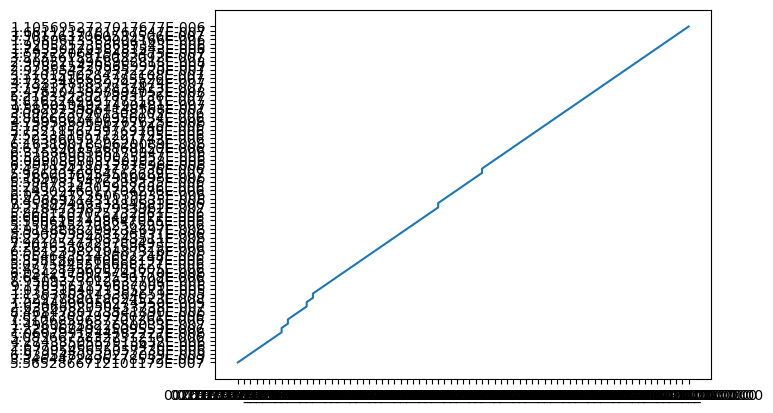

In [105]:
plt.plot (df_trim ['Date'], df_trim [ 'fnrt_flux_c'])

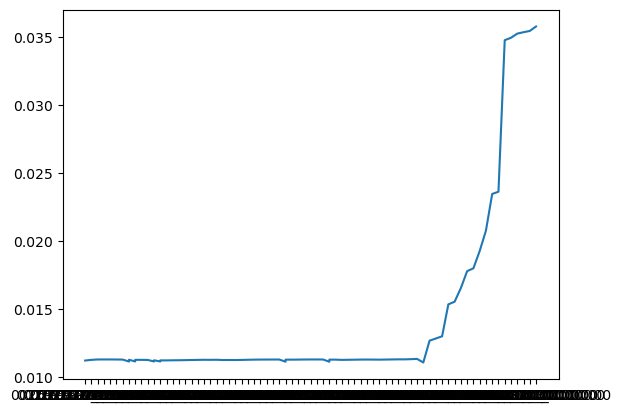

In [117]:
plt.plot (df_trim ['Date'], df_trim [ 'target_fnrt_c'])

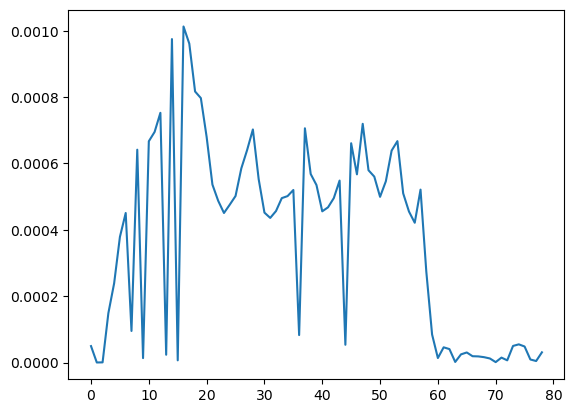

In [116]:
plt.plot (df_trim [ 'fnrt_flux_c']/df_trim [ 'target_fnrt_c'])

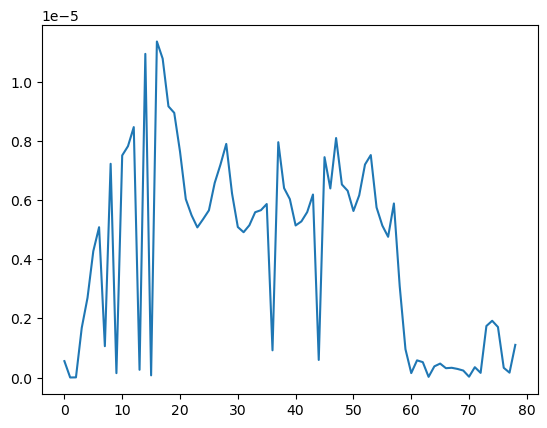

In [115]:
plt.plot(df_trim [ 'fnrt_flux_c'])